# Volcanic Eruption Impact on Climate from FLOR Ensemble: Agung 1963
* Wenchang Yang (wenchang@princeton.edu)
* Department of Geosciences, Princeton University

## Import, params and data

In [17]:
%matplotlib notebook
!date

import numpy as np
import matplotlib.pyplot as plt
# plt.rcParams['hatch.color']='g'
import xarray as xr
from scipy.stats import ttest_1samp

from plotsetting import *
from geoplots import mapplot, xticksyear, xticksmonth
import geoxarray

Fri Jun 22 16:04:53 EDT 2018


In [18]:
from data_CTL1860 import open_ensemble as get_ctl
from data_agung import open_data as get_volcano
volcano_name = 'Agung'
year_volcano = 1963
ens = range(1,31)
nbname = 'volcano_impact_on_climate_agung.ipynb'
new_names = {'grid_xt': 'lon', 'grid_yt': 'lat'}

land_mask = xr.open_dataset('/tigress/wenchang/MODEL_OUT/PIctl_CMIP6volc/POSTP/00010101.atmos_month.nc') \
    .land_mask.rename({'grid_xt': 'lon', 'grid_yt': 'lat'})
    
nino_ens = [ 7,  9, 12, 15, 17, 20, 22, 24, 27, 30]
nina_ens = [ 2,  6,  8, 13, 14, 18, 21, 25, 28, 29]
neut_ens = [1, 3, 4, 5, 10, 11, 16, 19, 23, 26]

ds = xr.open_dataset('/tigress/wenchang/MODEL_OUT/PIctl_CMIP6volc/POSTP/00010101.ocean_grid.nc')
ocean_tgrid_area = ds.area_t + ds.ht*0 # ds.ht*0 is the ocean mask

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


## Clear sky shortwave flux down at surface ``swdn_sfc_clr``

In [3]:
data_name = 'swdn_sfc_clr'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swdn_sfc_clr.ctl.nc
Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swdn_sfc_clr.nc


### Time series

In [4]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


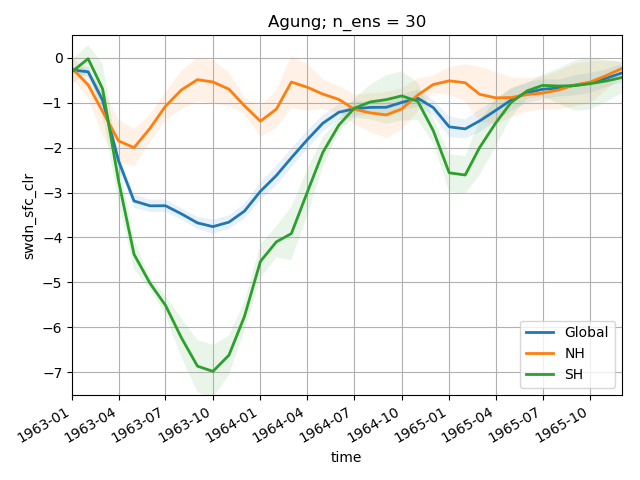

In [7]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim('1963-01', '1965-12')
plt.legend(frameon=True, loc='lower right')
plt.ylim(-7.5,.5)
plt.tight_layout()

## Clear sky shortwave flux down at TOA ``swdn_toa_clr``

In [8]:
data_name = 'swdn_toa_clr'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swdn_toa_clr.ctl.nc
Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swdn_toa_clr.nc


### Time series

In [9]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


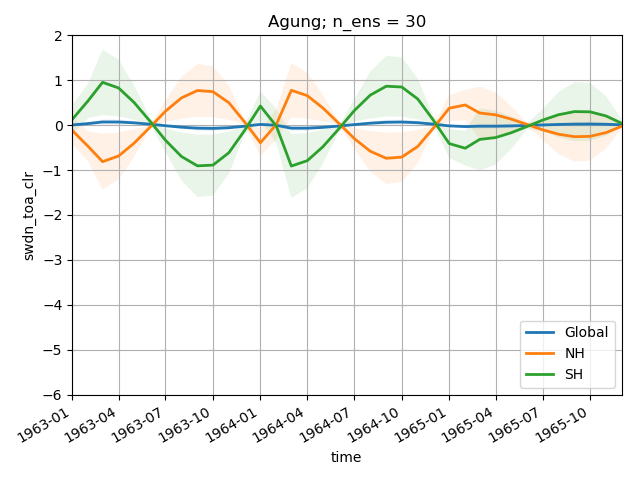

In [11]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim('1963-01', '1965-12')
plt.legend(frameon=True, loc='lower right')
plt.ylim(-6,2)
plt.tight_layout()

## Clear sky shortwave flux up at TOA ``swup_toa_clr``

In [12]:
data_name = 'swup_toa_clr'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])


Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swup_toa_clr.ctl.nc
Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.swup_toa_clr.nc


### Time series

In [13]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


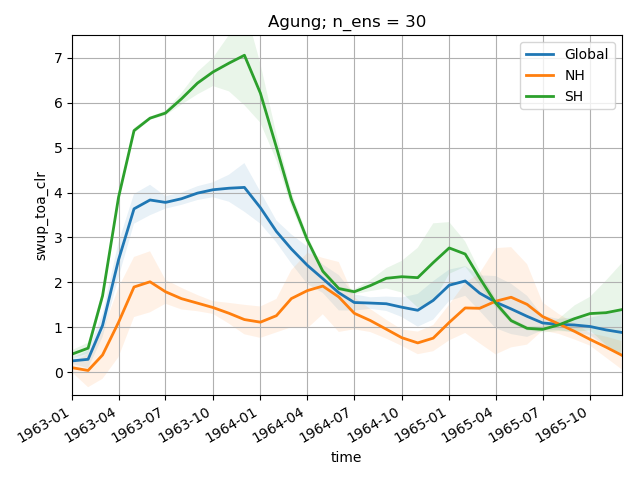

In [16]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim('1963-01', '1965-12')
plt.legend(frameon=True, loc='upper right')
plt.ylim(-.5,7.5)
plt.tight_layout()

## Net radiation (lw + sw) at TOA ``netrad_toa``

In [19]:
data_name = 'netrad_toa'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.netrad_toa.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.netrad_toa.nc


### Time series

In [20]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


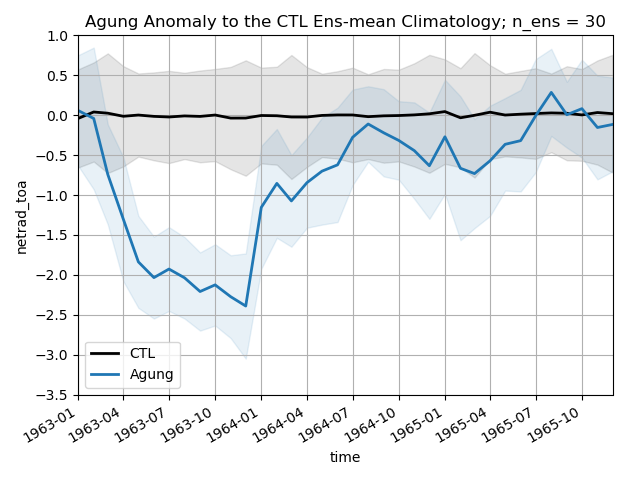

In [21]:
plt.fill_between(ts_ctl.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    ts_ctl.mean('en') - ts_ctl.std('en'),
#     ts_ctl.max('en'),
    ts_ctl.mean('en') + ts_ctl.std('en'),
    color='k', alpha=0.1)
plt.fill_between(ts_volcano.time.to_index().to_pydatetime(),
#     ts_volcano.min('en'),
    ts_volcano.mean('en') - ts_volcano.std('en'),
#     ts_volcano.max('en'),
    ts_volcano.mean('en') + ts_volcano.std('en'),
    color='C0', alpha=0.1)
ts_ctl.mean('en').plot(color='k', label='CTL')
ts_volcano.mean('en').plot(color='C0', label=volcano_name)
plt.legend(loc='lower left', frameon=True)
plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name} Anomaly to the CTL Ens-mean Climatology; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(ts_ctl.isel(time=[0,-1]).time.to_index())
plt.ylim(-3.5,1)
plt.tight_layout()

<IPython.core.display.Javascript object>


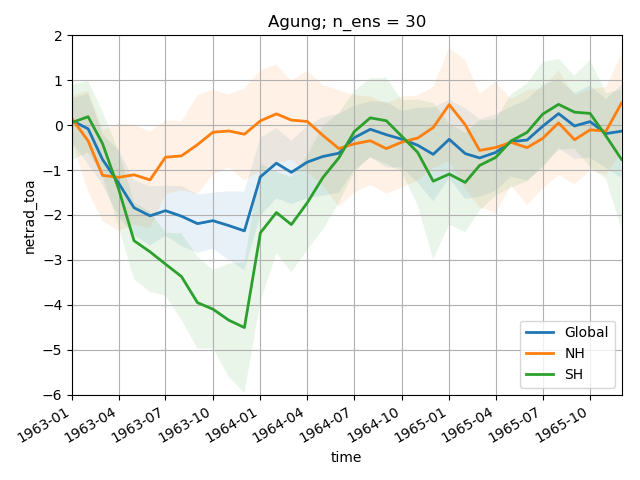

In [22]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim('1963-01', '1965-12')
plt.legend(frameon=True, loc='lower right')
plt.ylim(-6,2)
plt.tight_layout()

### Seasonal mean

In [10]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/core/common.py:594: FutureWarning: pd.TimeGrouper is deprecated and will be removed; Please use pd.Grouper(freq=...)
  label=label, base=base)


<IPython.core.display.Javascript object>


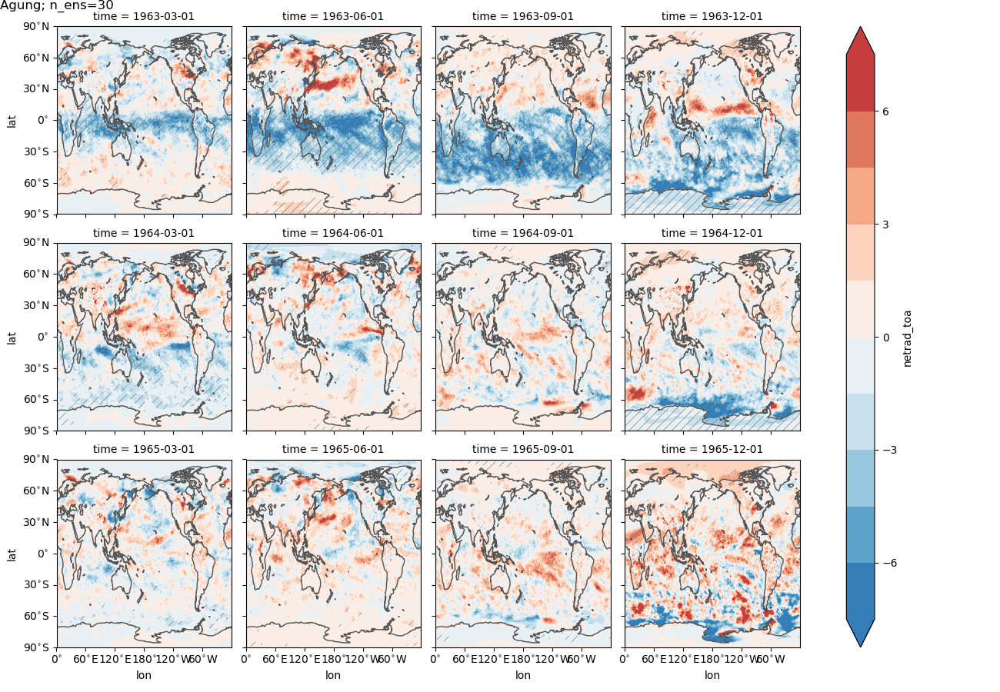

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2400: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:967: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [11]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

### Zonal mean

In [12]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

<IPython.core.display.Javascript object>


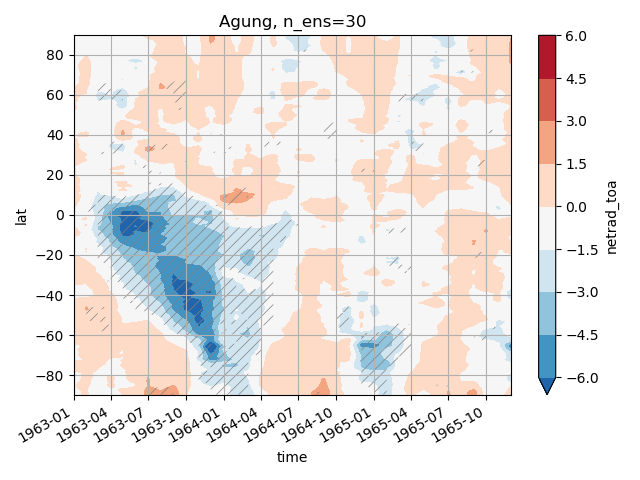

In [13]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0)
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.tight_layout()

## Surface downward solar radiation ``swdn_sfc``

In [23]:
data_name = 'swdn_sfc'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.swdn_sfc.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.swdn_sfc.nc


### Time series

In [24]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


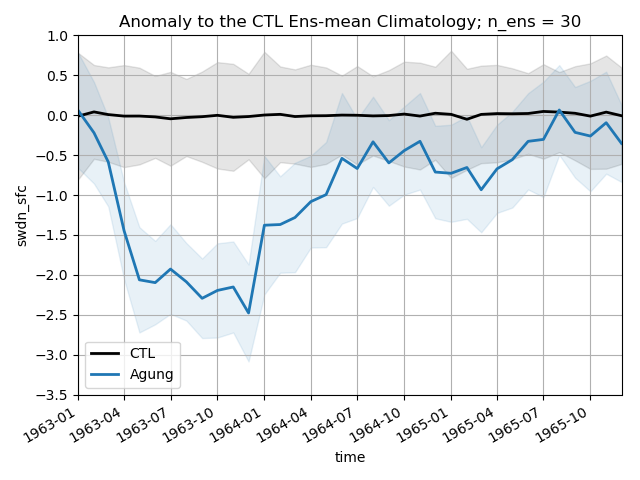

In [25]:
plt.fill_between(ts_ctl.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    ts_ctl.mean('en') - ts_ctl.std('en'),
#     ts_ctl.max('en'),
    ts_ctl.mean('en') + ts_ctl.std('en'),
    color='k', alpha=0.1)
plt.fill_between(ts_volcano.time.to_index().to_pydatetime(),
#     ts_volcano.min('en'),
    ts_volcano.mean('en') - ts_volcano.std('en'),
#     ts_volcano.max('en'),
    ts_volcano.mean('en') + ts_volcano.std('en'),
    color='C0', alpha=0.1)
ts_ctl.mean('en').plot(color='k', label='CTL')
ts_volcano.mean('en').plot(color='C0', label=volcano_name)
plt.legend(loc='lower left', frameon=True)
plt.ylabel(f'{data_name}')
plt.title(f'Anomaly to the CTL Ens-mean Climatology; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(ts_ctl.isel(time=[0,-1]).time.to_index())
plt.ylim(-3.5,1)
plt.tight_layout()

<IPython.core.display.Javascript object>


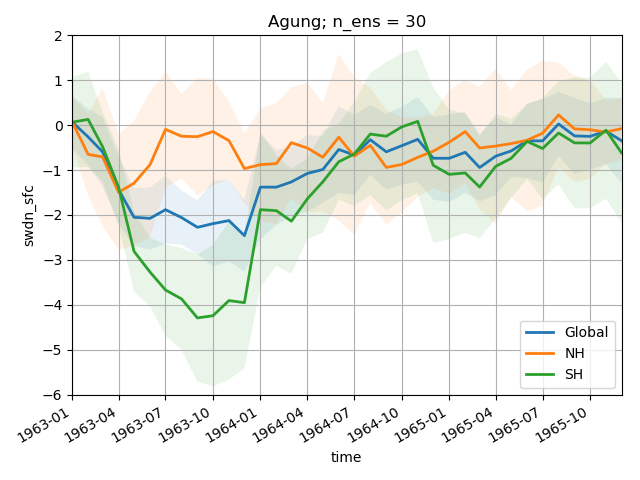

In [26]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim('1963-01', '1965-12')
plt.ylim(-6,2)
plt.legend(frameon=True, loc='lower right')
plt.tight_layout()

### Seasonal mean

In [8]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1818: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


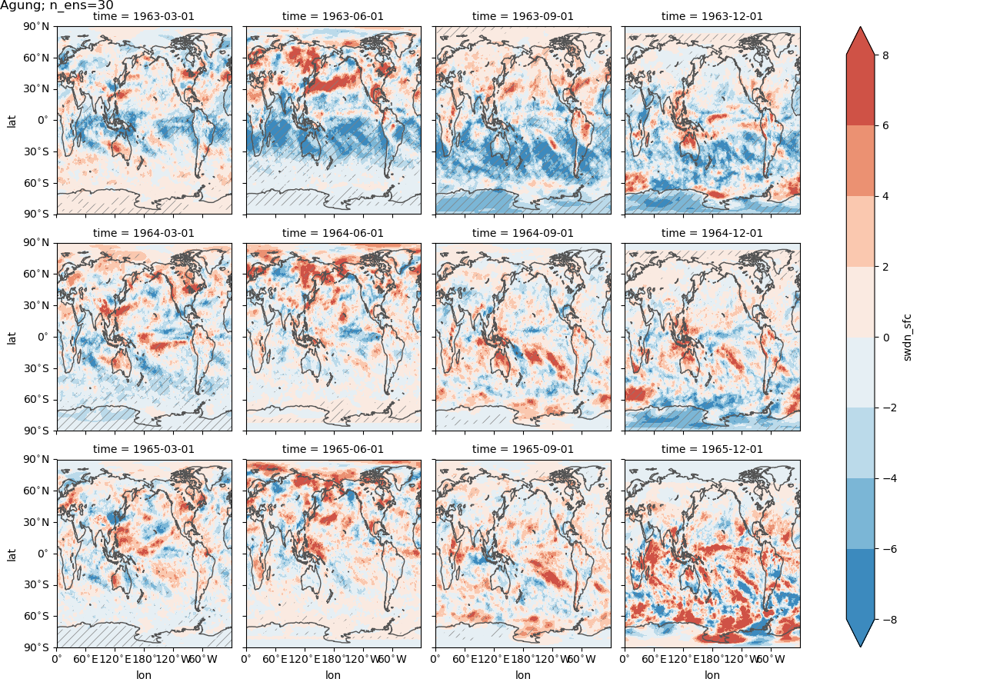

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [9]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

### Zonal mean

In [10]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1818: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


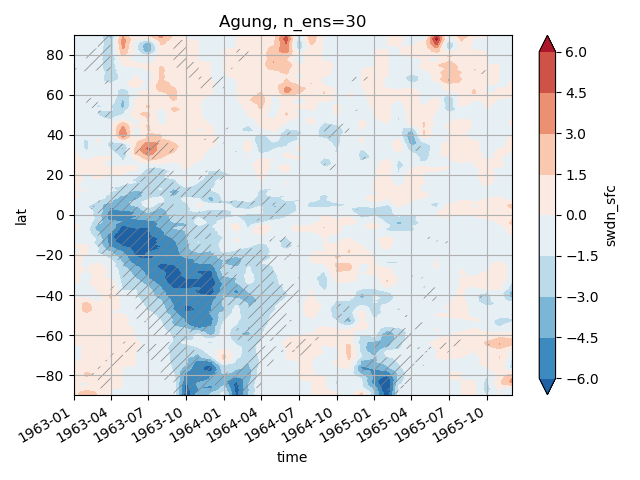

In [11]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0)
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.tight_layout()

## Surface temperature ``t_surf``

In [65]:
data_name = 't_surf'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.t_surf.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.t_surf.nc


### Time series

In [28]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


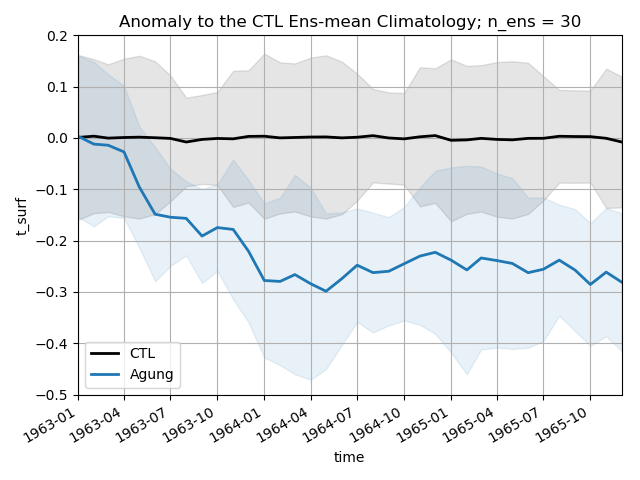

In [29]:
plt.fill_between(ts_ctl.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    ts_ctl.mean('en') - ts_ctl.std('en'),
#     ts_ctl.max('en'),
    ts_ctl.mean('en') + ts_ctl.std('en'),
    color='k', alpha=0.1)
plt.fill_between(ts_volcano.time.to_index().to_pydatetime(),
#     ts_volcano.min('en'),
    ts_volcano.mean('en') - ts_volcano.std('en'),
#     ts_volcano.max('en'),
    ts_volcano.mean('en') + ts_volcano.std('en'),
    color='C0', alpha=0.1)
ts_ctl.mean('en').plot(color='k', label='CTL')
ts_volcano.mean('en').plot(color='C0', label=volcano_name)
plt.legend(loc='lower left', frameon=True)
plt.ylabel(f'{data_name}')
plt.title(f'Anomaly to the CTL Ens-mean Climatology; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(ts_ctl.isel(time=[0,-1]).time.to_index())
plt.ylim(-.5,.2)
plt.tight_layout()

<IPython.core.display.Javascript object>


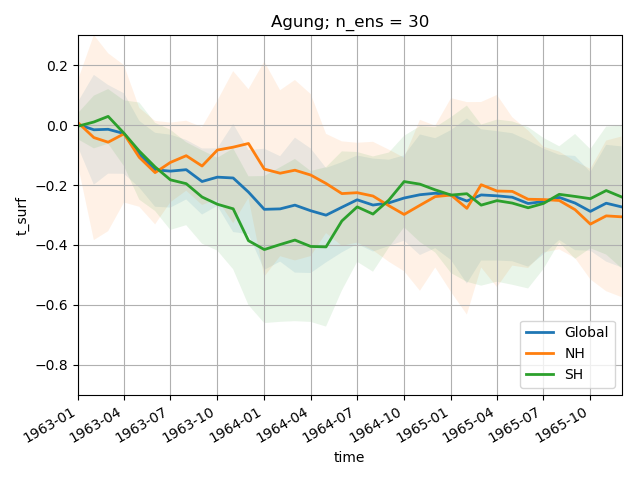

In [30]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
    tsa.mean('en') - tsa.std('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(ts_ctl.isel(time=[0,-1]).time.to_index())
plt.ylim(-.9,.3)
plt.legend(frameon=True, loc='lower right')
plt.tight_layout()

### Seasonal mean

In [66]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


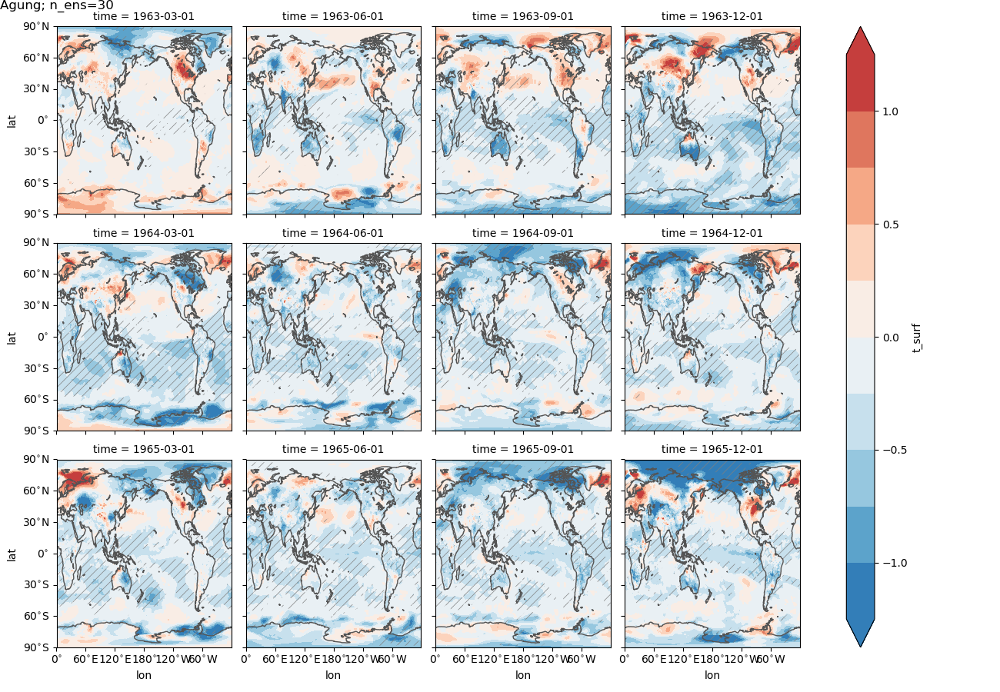

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [17]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

<IPython.core.display.Javascript object>


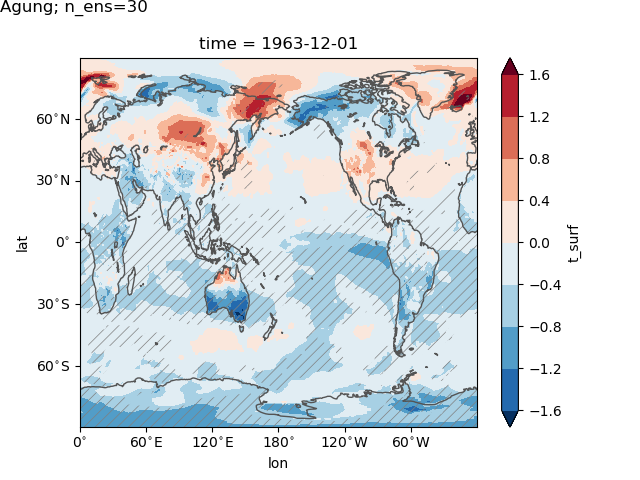

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [80]:
f = da.sel(time=f'{year_volcano}-12-01').plot.contourf(
    robust=True, levels=np.arange(-1.6,1.7,.4), center=0, extend='both')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano}-12-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


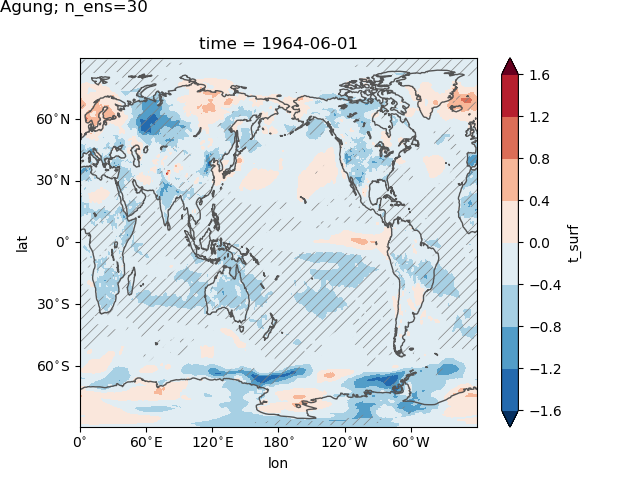

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [79]:
f = da.sel(time=f'{year_volcano+1}-06-01').plot.contourf(
    robust=True, levels=np.arange(-1.6,1.7,.4), center=0, extend='both')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


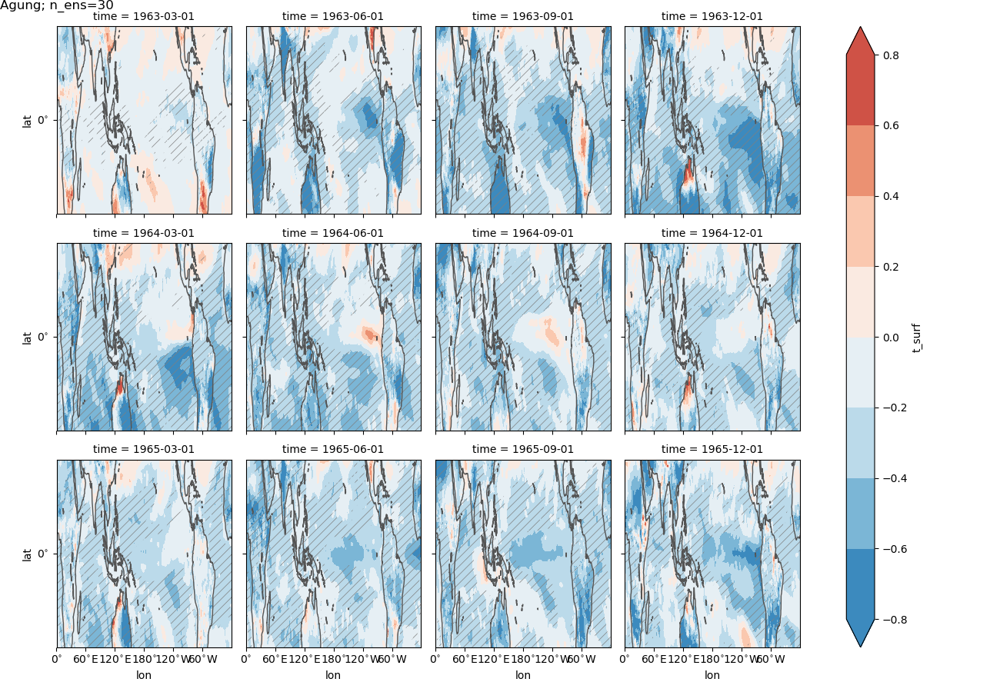

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [18]:
# tropics only
latrange = slice(-30,30)
f = da.sel(lat=latrange).plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).sel(lat=latrange).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

### Zonal mean

In [19]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

<IPython.core.display.Javascript object>


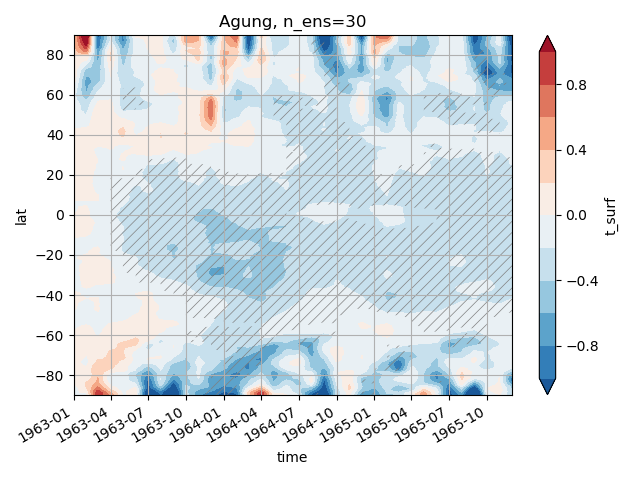

In [20]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0)
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.tight_layout()

### ENSO

In [59]:
# ENSO areas are defined from: 
# https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni
lons = dict(nino12=slice(360-90,360-80), 
    nino3=slice(360-150, 360-90),
    nino34=slice(360-170, 360-120),
    nino4=slice(160, 360-150))
lats = dict(nino12=slice(-10,0),
    nino3=slice(-5,5),
    nino34=slice(-5,5),
    nino4=slice(-5,5))
ts_ctl = da_ctl.sel(lon=lons['nino34'], lat=lats['nino34']).geo.fldmean()
ts_volc = da_volcano.sel(lon=lons['nino34'], lat=lats['nino34']).geo.fldmean()
ts_ctl_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
tsa_ctl = ts_ctl.groupby('time.month') - ts_ctl_clim
tsa_volc = ts_volc.groupby('time.month') - ts_ctl_clim

<IPython.core.display.Javascript object>


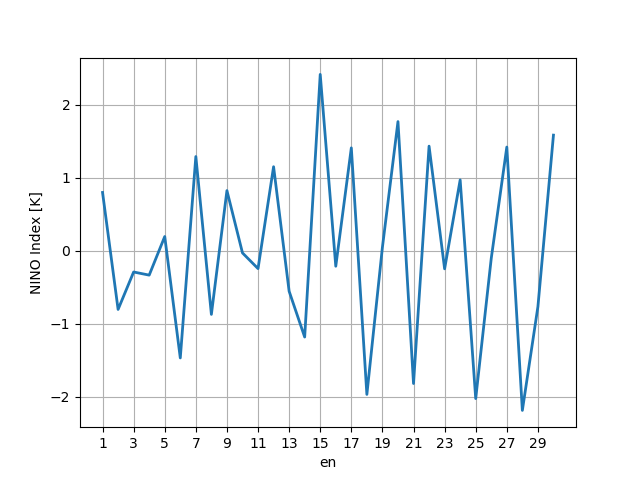

Nino ens: [ 7  9 12 15 17 20 22 24 27 30]
Nina ens: [ 2  6  8 13 14 18 21 25 28 29]
Neut ens: [1, 3, 4, 5, 10, 11, 16, 19, 23, 26]


In [60]:
# nino_i = tsa_volc.sel(time='1963-01').squeeze()
nino_i = tsa_ctl.sel(time=slice('1963-10', '1963-12')).mean('time')
ens_dict = dict()
ens_dict['nino'] = nino_i.en[nino_i > nino_i.quantile(0.67)].values
ens_dict['nina'] = nino_i.en[nino_i < nino_i.quantile(0.33)].values
ens_dict['neut'] = [en for en in range(1,31) if en not in ens_dict['nino'] and en not in ens_dict['nina']]
nino_i.plot()
# tsa_ctl.sel(time='1963-01').squeeze().plot()
plt.xticks(range(1,31,2))
plt.ylabel('NINO Index [K]')
plt.grid(True)
print('Nino ens:', ens_dict['nino'])
print('Nina ens:', ens_dict['nina'])
print('Neut ens:', ens_dict['neut'])

<IPython.core.display.Javascript object>


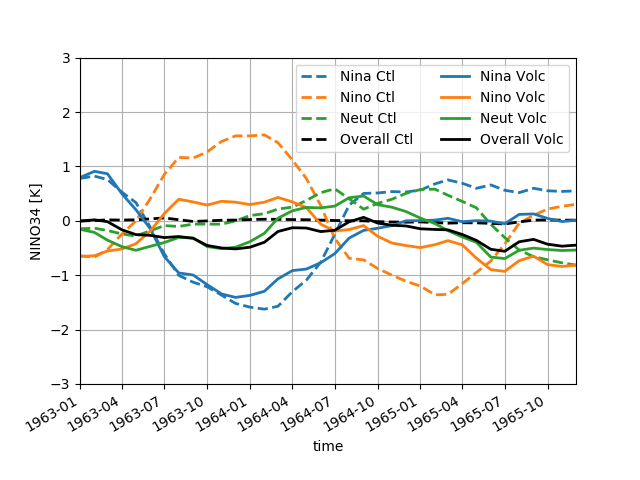

In [61]:
tsa_ctl.sel(en=ens_dict['nina']).mean('en').plot(label='Nina Ctl', color='C0', linestyle='--')
tsa_ctl.sel(en=ens_dict['nino']).mean('en').plot(label='Nino Ctl', color='C1', linestyle='--')
tsa_ctl.sel(en=ens_dict['neut']).mean('en').plot(label='Neut Ctl', color='C2', linestyle='--')
tsa_ctl.sel().mean('en').plot(label='Overall Ctl', color='k', linestyle='--')

tsa_volc.sel(en=ens_dict['nina']).mean('en').plot(label='Nina Volc', color='C0', linestyle='-')
tsa_volc.sel(en=ens_dict['nino']).mean('en').plot(label='Nino Volc', color='C1', linestyle='-')
tsa_volc.sel(en=ens_dict['neut']).mean('en').plot(label='Neut Volc', color='C2', linestyle='-')
tsa_volc.sel().mean('en').plot(label='Overall Volc', color='k', linestyle='-')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(tsa_ctl.time.isel(time=[0,-1]).to_index())
plt.ylim(-3,3)
plt.ylabel('NINO34 [K]')
plt.legend(frameon=True, loc='upper right', ncol=2)

<IPython.core.display.Javascript object>


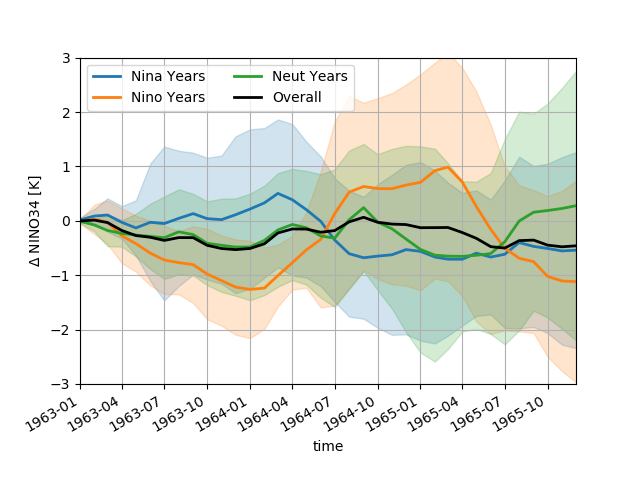

Text(0,0.5,'$\\Delta$ NINO34 [K]')

In [62]:
tsaa = (tsa_volc - tsa_ctl).sel(en=ens_dict['nina'])
plt.fill_between(tsaa.time.to_index().to_pydatetime(),
    tsaa.mean('en') - tsaa.std('en'),
    tsaa.mean('en') + tsaa.std('en'),
    alpha=0.2, color='C0')
tsaa.mean('en').plot(label='Nina Years',color='C0')

tsaa = (tsa_volc - tsa_ctl).sel(en=ens_dict['nino'])
plt.fill_between(tsaa.time.to_index().to_pydatetime(),
    tsaa.mean('en') - tsaa.std('en'),
    tsaa.mean('en') + tsaa.std('en'),
    alpha=0.2, color='C1')
tsaa.mean('en').plot(label='Nino Years', color='C1')

tsaa = (tsa_volc - tsa_ctl).sel(en=ens_dict['neut'])
plt.fill_between(tsaa.time.to_index().to_pydatetime(),
    tsaa.mean('en') - tsaa.std('en'),
    tsaa.mean('en') + tsaa.std('en'),
    alpha=0.2, color='C2')
tsaa.mean('en').plot(label='Neut Years', color='C2')

tsaa = (tsa_volc - tsa_ctl)
tsaa.mean('en').plot(label='Overall', color='k')


plt.legend(frameon=True, loc='upper left', ncol=2)
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(tsaa.time.isel(time=[0,-1]).to_index())
plt.ylim(-3,3)
plt.ylabel('$\Delta$ NINO34 [K]')

## Precipitation ``precip``

In [45]:
data_name = 'precip'
scale_factor = 3600*24

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

da_ctl = da_ctl * scale_factor
da_volcano = da_volcano * scale_factor

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.precip.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.precip.nc


### Time series

In [32]:
# global mean time series
ts_ctl = da_ctl.geo.fldmean()
ts_volcano = da_volcano.geo.fldmean()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).sel(lat=slice(0,90)).geo.fldmean(),
           SH=(da_volcano - da_ctl).sel(lat=slice(-90,0)).geo.fldmean())

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


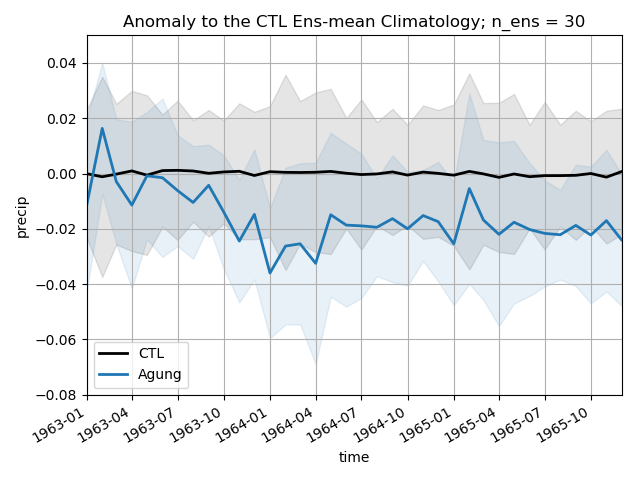

In [33]:
plt.fill_between(ts_ctl.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    ts_ctl.mean('en') - ts_ctl.std('en'),
#     ts_ctl.max('en'),
    ts_ctl.mean('en') + ts_ctl.std('en'),
    color='k', alpha=0.1)
plt.fill_between(ts_volcano.time.to_index().to_pydatetime(),
#     ts_volcano.min('en'),
    ts_volcano.mean('en') - ts_volcano.std('en'),
#     ts_volcano.max('en'),
    ts_volcano.mean('en') + ts_volcano.std('en'),
    color='C0', alpha=0.1)
ts_ctl.mean('en').plot(color='k', label='CTL')
ts_volcano.mean('en').plot(color='C0', label=volcano_name)
plt.legend(loc='lower left', frameon=True)
plt.ylabel(f'{data_name}')
plt.title(f'Anomaly to the CTL Ens-mean Climatology; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(ts_ctl.isel(time=[0,-1]).time.to_index())
plt.ylim(-.08,.05)
plt.tight_layout()

<IPython.core.display.Javascript object>


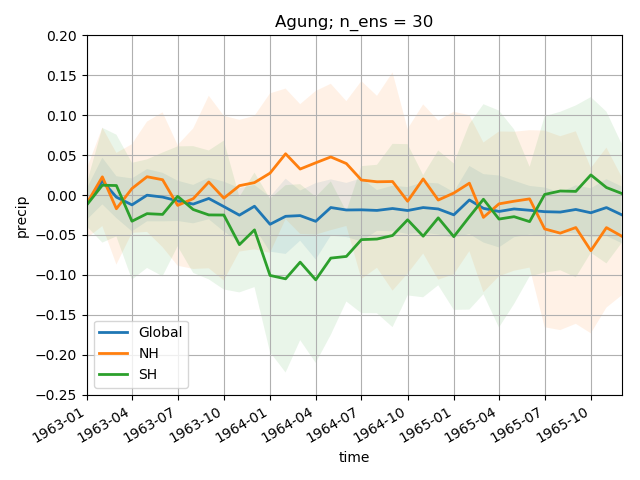

In [34]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
#     ts_ctl.min('en'),
    tsa.mean('en') - tsa.std('en'),
#     ts_ctl.max('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(tsa.isel(time=[0,-1]).time.to_index())
plt.ylim(-.25,.20)
plt.legend(frameon=True, loc='lower left')
plt.tight_layout()

### Seasonal mean

In [89]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


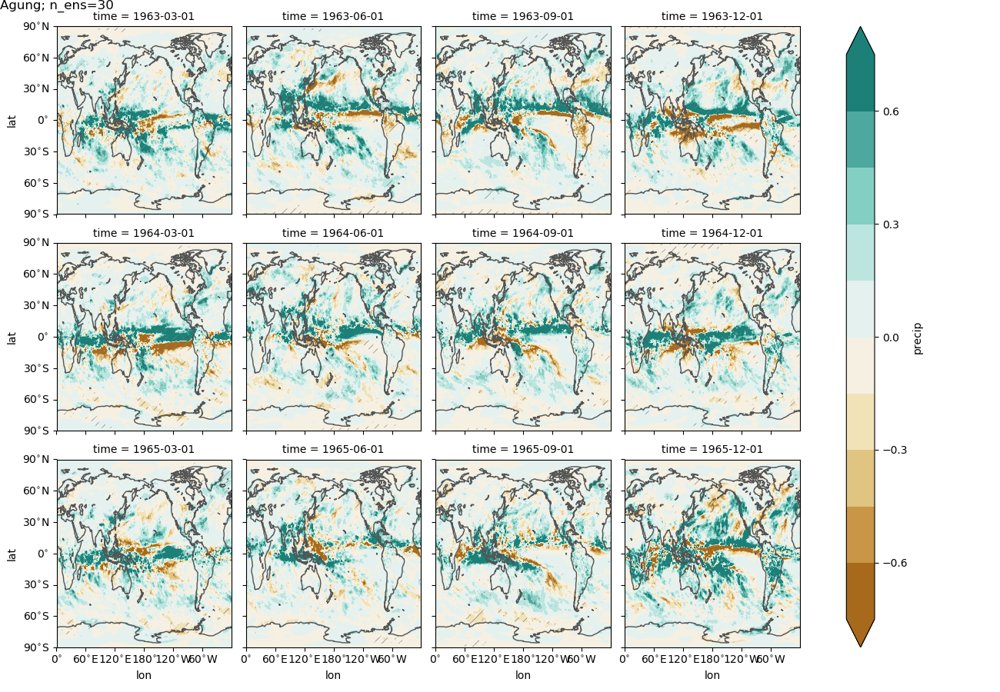

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [26]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both', cmap='BrBG')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

<IPython.core.display.Javascript object>


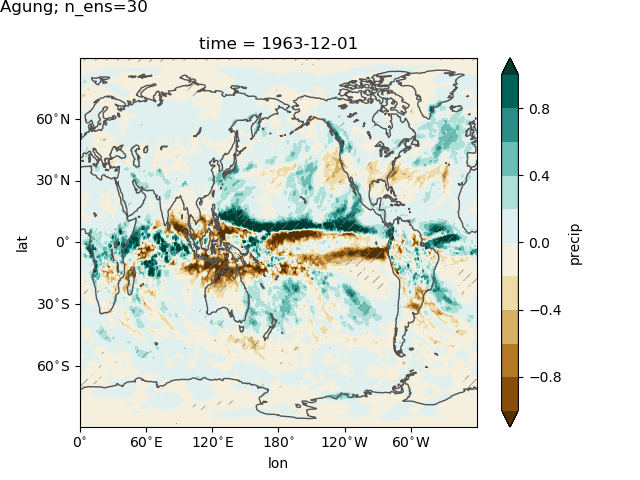

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [86]:
f = da.sel(time=f'{year_volcano}-12-01').plot.contourf(
    robust=True, levels=np.arange(-1,1.1,.2), center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano}-12-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


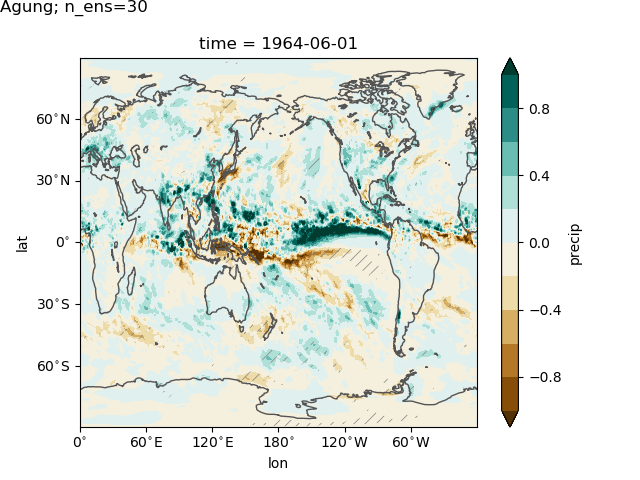

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [87]:
f = da.sel(time=f'{year_volcano+1}-06-01').plot.contourf(
    robust=True, levels=np.arange(-1,1.1,.2), center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


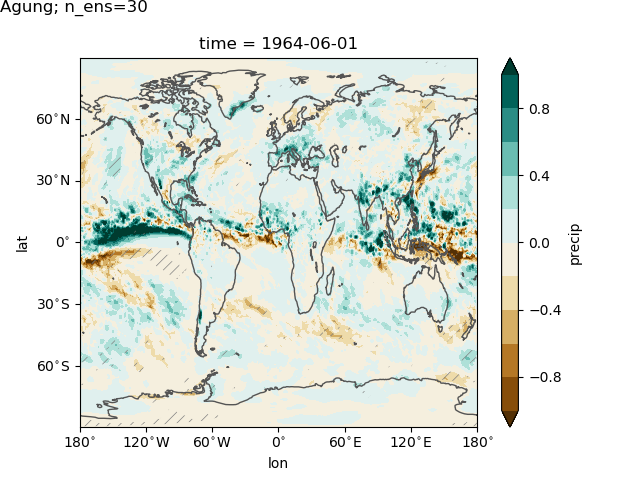

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; n_ens=30')

In [112]:
lon = da.lon.roll(lon=int(576/2)).values
lon[lon>180] = lon[lon>180] - 360
f = da.sel(time=f'{year_volcano+1}-06-01').roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    robust=True, levels=np.arange(-1,1.1,.2), center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left', va='top')

### Seasonal mean: Nino ens

In [8]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.sel(en=nino_ens) ##################
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


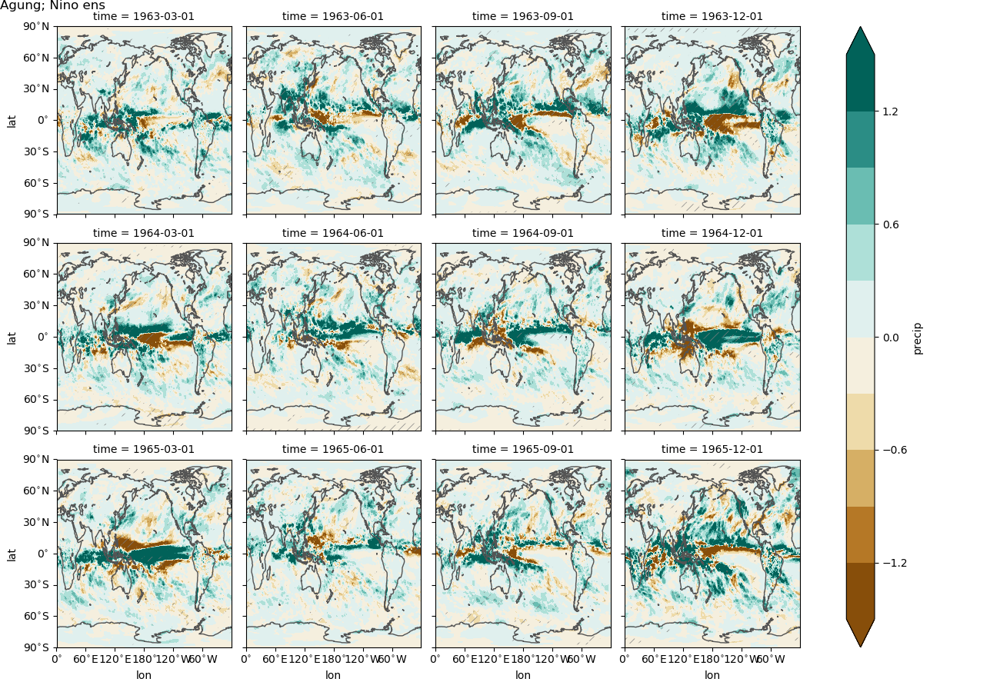

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


Text(0,1,'Agung; Nino ens')

In [9]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both', cmap='BrBG')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nino ens', x=0, y=1, ha='left')

<IPython.core.display.Javascript object>


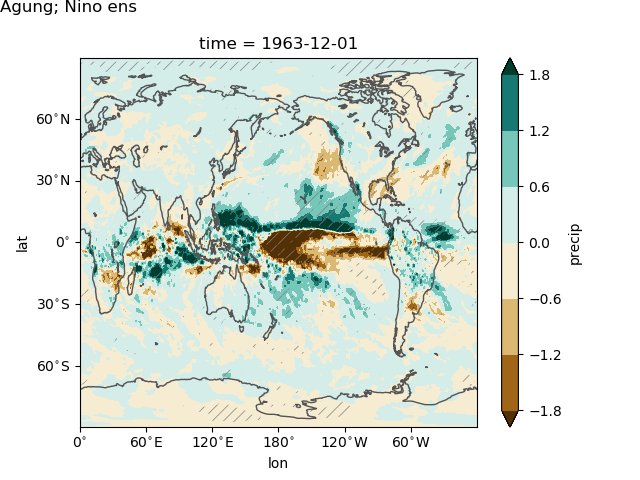

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nino ens')

In [10]:
f = da.sel(time=f'{year_volcano}-12-01').plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano}-12-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nino ens', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


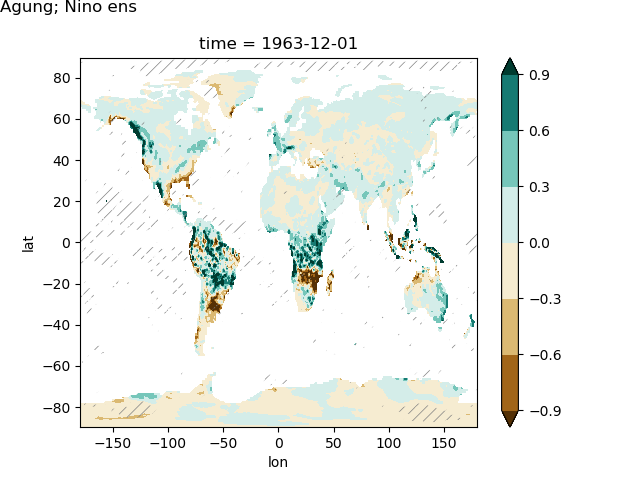

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nino ens')

In [37]:
lon = da.lon.roll(lon=int(576/2)).values
lon[lon>180] = lon[lon>180] - 360
f = da.sel(time=f'{year_volcano}-12-01').where(land_mask>0.5).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
# mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano}-12-01')
pp.where(pp<0.05).pipe(lambda x:x*0).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nino ens', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


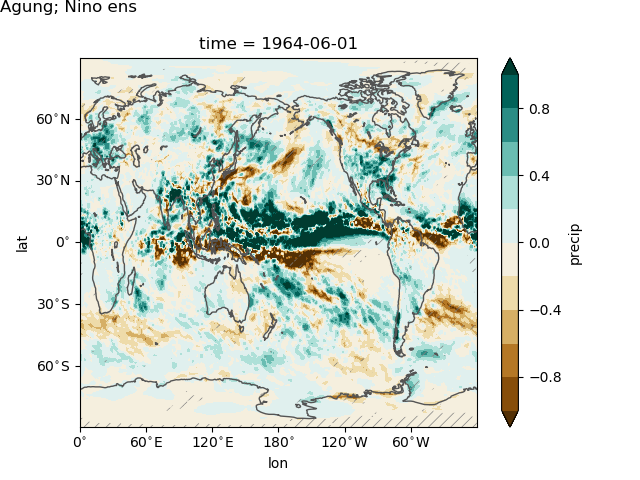

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nino ens')

In [11]:
f = da.sel(time=f'{year_volcano+1}-06-01').plot.contourf(
    robust=True, levels=np.arange(-1,1.1,.2), center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nino ens', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


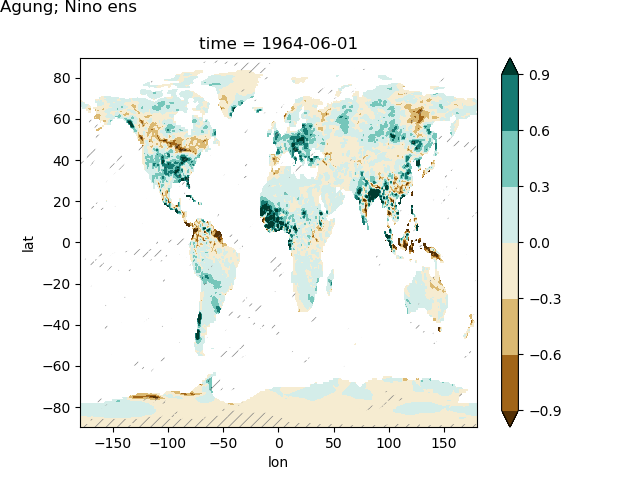

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nino ens')

In [38]:
lon = da.lon.roll(lon=int(576/2)).values
lon[lon>180] = lon[lon>180] - 360
f = da.sel(time=f'{year_volcano+1}-06-01').where(land_mask>.5).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
# mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nino ens', x=0, y=1, ha='left', va='top')

### Seasonal mean: Nina ens

In [24]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.sel(en=nina_ens)
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


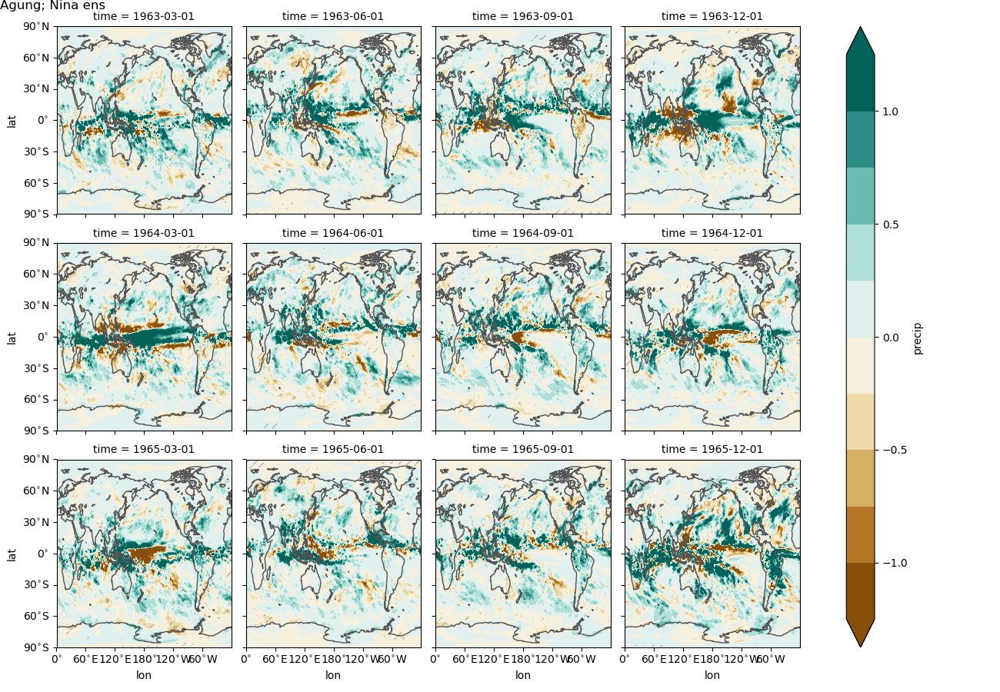

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nina ens')

In [26]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both', cmap='BrBG')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nina ens', x=0, y=1, ha='left')

<IPython.core.display.Javascript object>


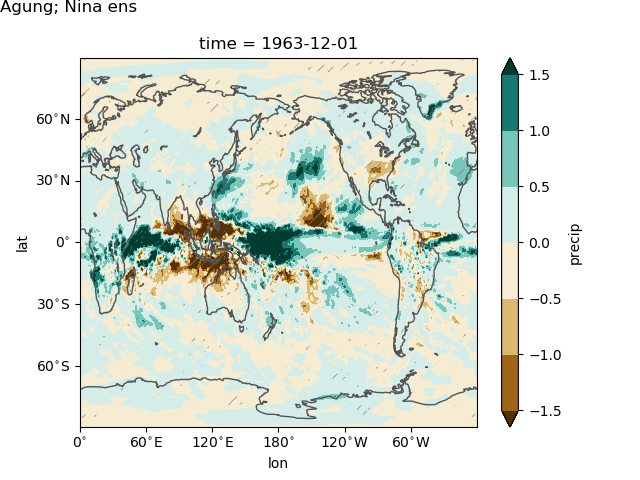

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nina ens')

In [28]:
f = da.sel(time=f'{year_volcano}-12-01').plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano}-12-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nina ens', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


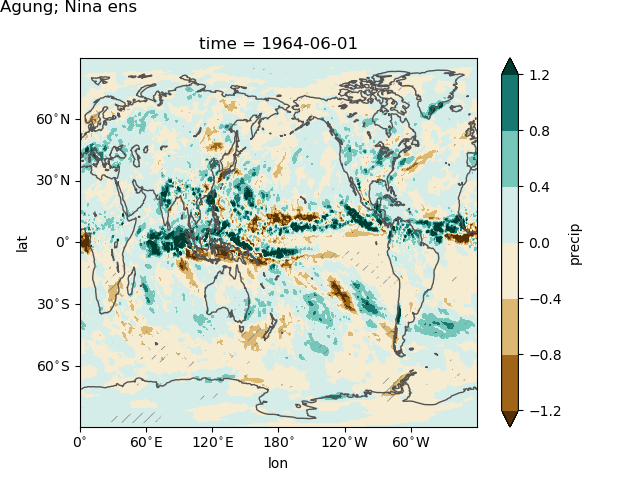

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nina ens')

In [30]:
f = da.sel(time=f'{year_volcano+1}-06-01').plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nina ens', x=0, y=1, ha='left', va='top')

<IPython.core.display.Javascript object>


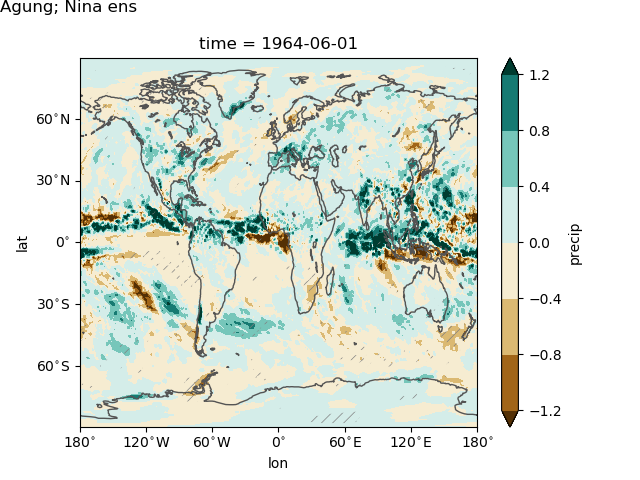

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:2446: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/contour.py:960: UserWarning: The following kwargs were not used by contour: 'facecolor'
  s)


Text(0,1,'Agung; Nina ens')

In [31]:
lon = da.lon.roll(lon=int(576/2)).values
lon[lon>180] = lon[lon>180] - 360
f = da.sel(time=f'{year_volcano+1}-06-01').roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    robust=True, 
#     levels=np.arange(-1,1.1,.2), 
    levels=None,
    center=0, extend='both', cmap='BrBG')
mapplot(lw=0.2)
pp = pvalue.sel(time=f'{year_volcano+1}-06-01')
pp.where(pp<0.05).pipe(lambda x:x*0).roll(lon=int(576/2)).assign_coords(lon=lon).plot.contourf(
    colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; Nina ens', x=0, y=1, ha='left', va='top')

### Zonal mean

In [27]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

<IPython.core.display.Javascript object>


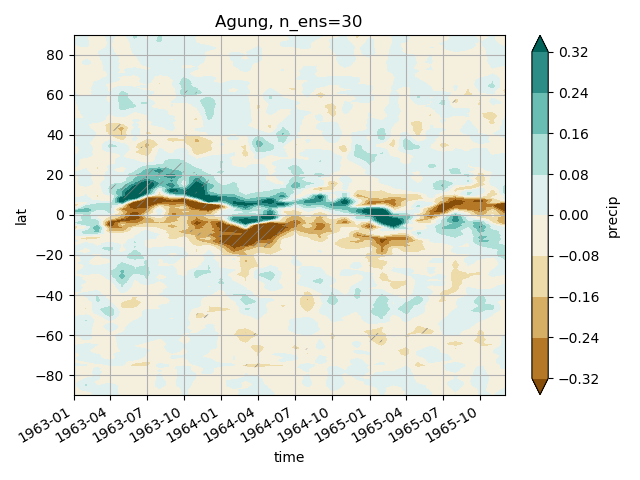

In [28]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.tight_layout()

### Zonal mean: Land only, 20W-50E

In [26]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.where(land_mask>.5).where((daa.lon>=340)|(daa.lon<=55)).mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


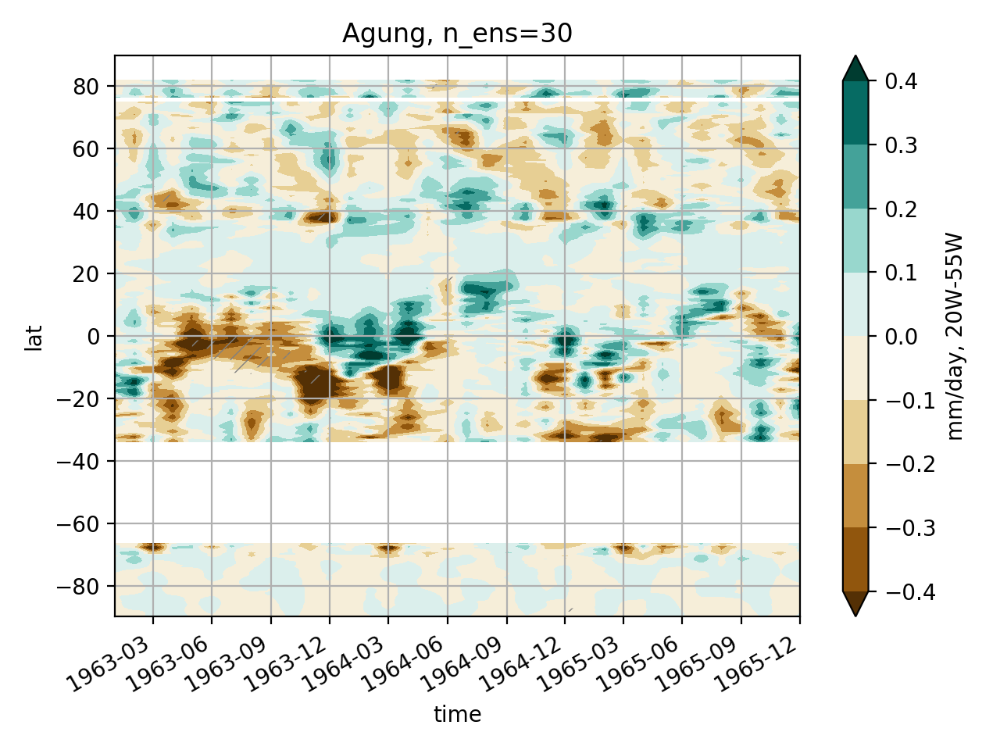

In [42]:
da.rename('mm/day, 20W-55W').plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(3,13,3))
plt.grid(True)
plt.tight_layout()

### Zonal mean: Land only

In [41]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.where(land_mask>.5).mean('lon') # zonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


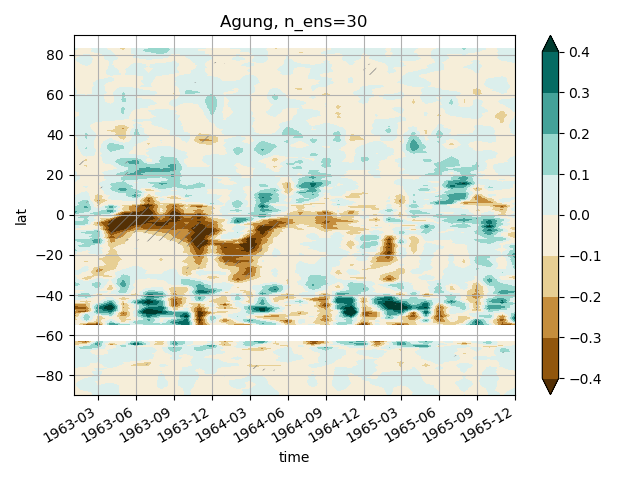

In [42]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, n_ens={len(ens)}')
xticksmonth(range(3,13,3))
plt.grid(True)
plt.tight_layout()

### Zonal mean Land only, Nino ens

In [5]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.where(land_mask>.5).mean('lon') # zonal mean
daa = daa.sel(en=nino_ens)
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


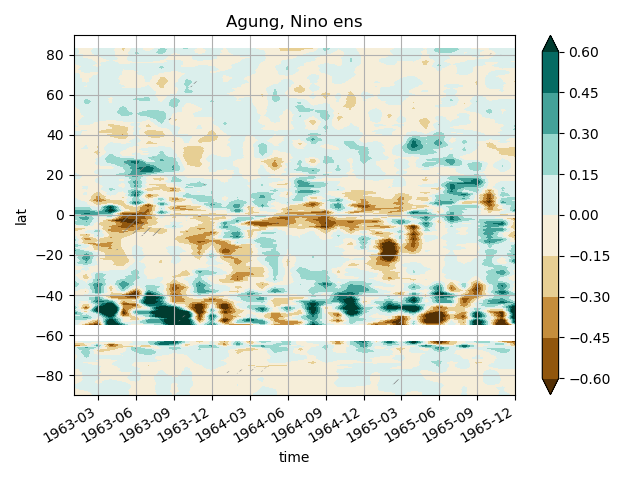

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


In [6]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, Nino ens')
xticksmonth(range(3,13,3))
plt.grid(True)
plt.tight_layout()

### Zonal mean: Land only, Nina ens

In [49]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.where(land_mask>.5).mean('lon') # zonal mean
daa = daa.sel(en=nina_ens)
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


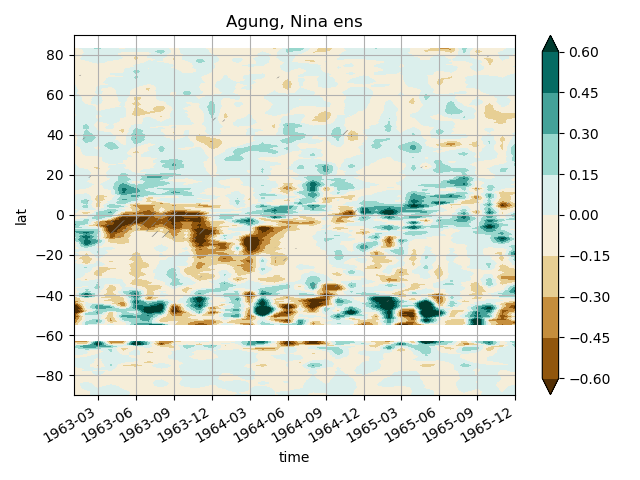

In [51]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, Nina ens')
xticksmonth(range(3,13,3))
plt.grid(True)
plt.tight_layout()

### Zonal mean: Land only, Neut ens

In [52]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.where(land_mask>.5).mean('lon') # zonal mean
daa = daa.sel(en=neut_ens)
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in list(da.dims)])

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<IPython.core.display.Javascript object>


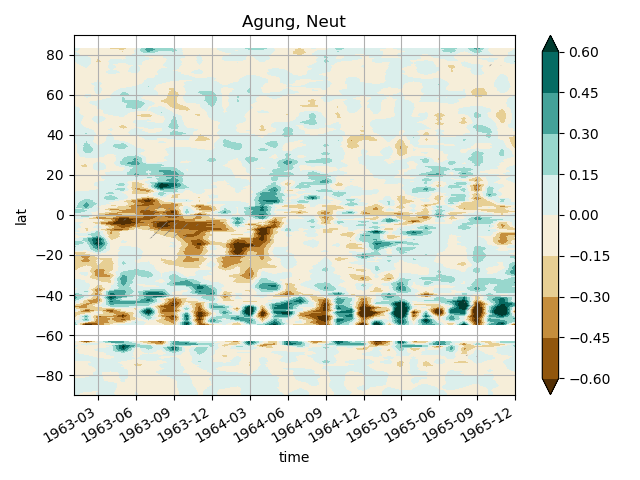

In [53]:
da.plot.contourf(x='time', y='lat', levels=10, robust=True, center=0, cmap='BrBG')
pvalue.where(pvalue<0.05).pipe(lambda x:x*0).plot.contourf(x='time', y='lat',
        colors='None', hatches=['///'], add_colorbar=False, add_labels=False)
plt.gcf().autofmt_xdate()
plt.title(f'{volcano_name}, Neut')
xticksmonth(range(3,13,3))
plt.grid(True)
plt.tight_layout()

### ITCZ

<IPython.core.display.Javascript object>


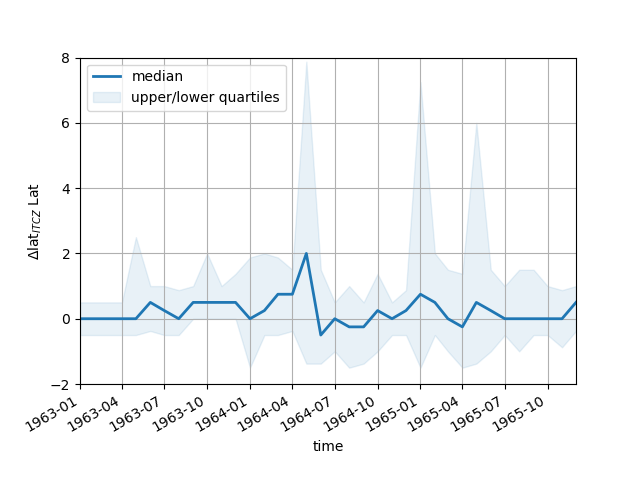

(-2, 8)

In [35]:
da_lonmean_ctl = da_ctl.mean('lon')
lat_itcz_ctl = da_lonmean_ctl.lat[da_lonmean_ctl.argmax('lat')]

da_lonmean_volc = da_volcano.mean('lon')
lat_itcz_volc = da_lonmean_volc.lat[da_lonmean_volc.argmax('lat')]

dlat_itcz = lat_itcz_volc - lat_itcz_ctl

plt.fill_between(dlat_itcz.time.to_index().to_pydatetime(),
    dlat_itcz.quantile(0.25, dim='en'),
    dlat_itcz.quantile(0.75, dim='en'),
    color='C0', alpha=0.1, label='upper/lower quartiles')
dlat_itcz.median('en').plot(color='C0', label='median')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(dlat_itcz.isel(time=[0,-1]).time.to_index())
plt.ylabel('$\Delta$lat$_{ITCZ}$ Lat')
plt.legend(frameon=True, loc='upper left')
plt.ylim(-2,8)

In [51]:
plt.tight_layout?

<IPython.core.display.Javascript object>


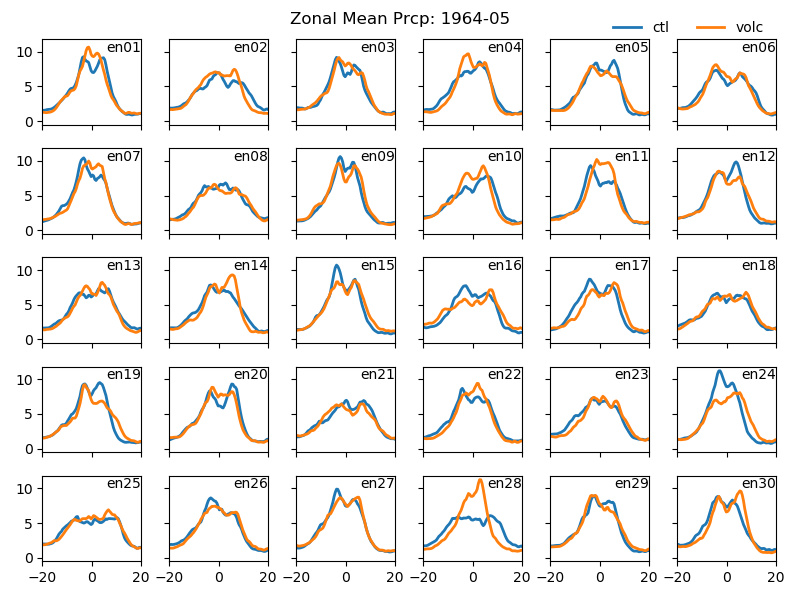

In [57]:
year_month = '1964-05'
fig, axes = plt.subplots(5,6, figsize=(8,6), sharex=True, sharey=True)
for i,ax in enumerate(axes.flat, start=1):
    plt.sca(ax)
    da_lonmean_ctl.sel(time=year_month).sel(en=i).plot(label='ctl', ax=ax)
    da_lonmean_volc.sel(time=year_month).sel(en=i).plot(label='volc', ax=ax)
    plt.title('')
    plt.xlabel('')
    plt.ylabel('')
    plt.xlim(-20,20)
    if i == 6:
        plt.legend(bbox_to_anchor=(1,0.9), ncol=2, loc='lower right')
    plt.text(1,.98,f'en{i:02d}', transform=ax.transAxes, ha='right', va='top')
    
plt.suptitle(f'Zonal Mean Prcp: {year_month}')
plt.tight_layout(w_pad=-4)

## Sea level pressure ``slp``

In [31]:
data_name = 'slp'

ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.slp.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.slp.nc


In [32]:
# seasonal mean
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


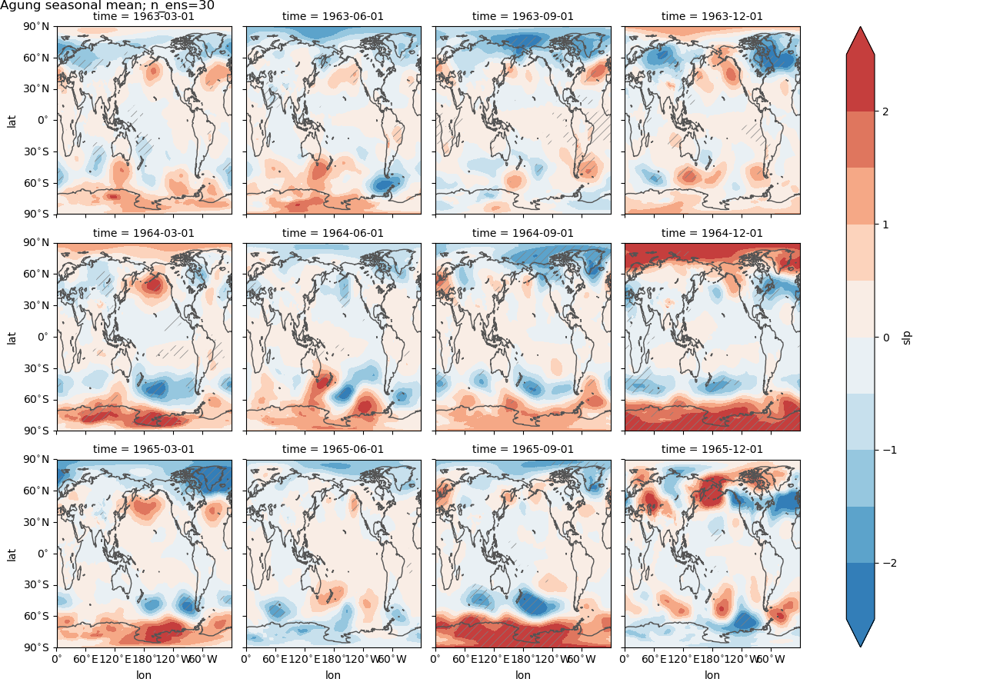

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [33]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name} seasonal mean; n_ens={len(ens)}', x=0, y=1, ha='left')

<IPython.core.display.Javascript object>


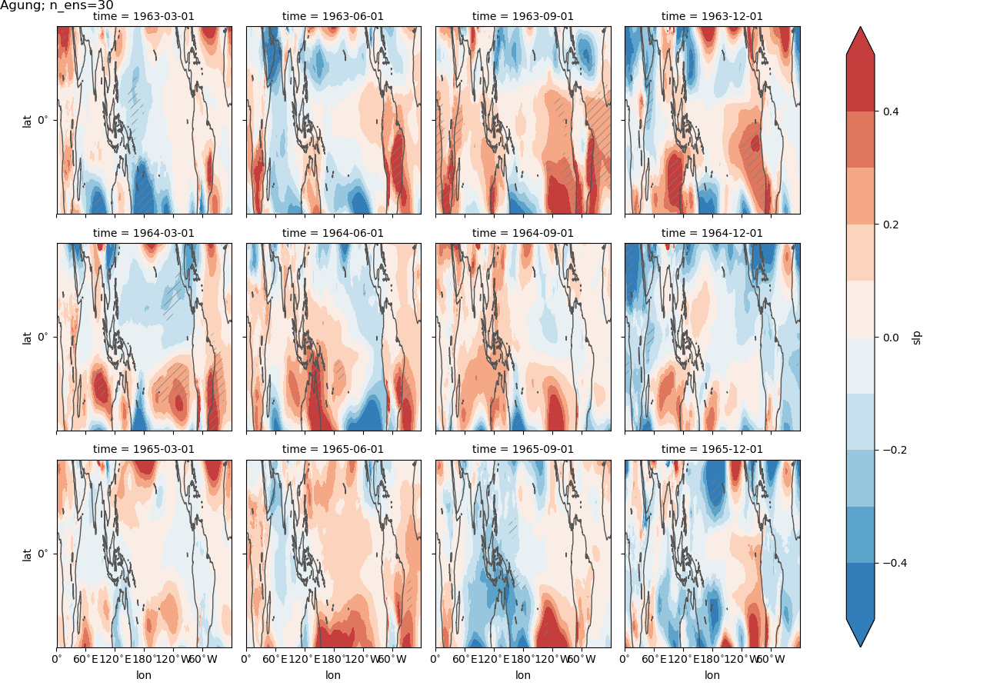

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/matplotlib/cbook.py:2649: UserWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'
  seen=seen, canon=canonical, used=seen[-1]))


In [34]:
# tropics only
latrange = slice(-30,30)
f = da.sel(lat=latrange).plot.contourf(col='time', col_wrap=4,
    robust=True, levels=10, center=0, extend='both')
for ii, ax in enumerate(f.axes.flat):
    mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).sel(lat=latrange).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False)
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

## Zonal-mean temperature ``temp``

In [190]:
data_name = 'temp'

ncfile = f'cache/{nbname}.{data_name}.lonmean.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).mean('lon').load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.lonmean.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, ens=ens).rename(new_names).mean('lon').load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

Data loaded from cache/volcano_impact_on_climate_agung.ipynb.temp.lonmean.ctl.nc
Data loaded from cache/volcano_impact_on_climate_agung.ipynb.temp.lonmean.nc


In [191]:
daa = da_volcano - da_ctl# dims: en, time, grid_xt, grid_yt
daa = daa.resample(time='QS-Dec').mean('time').isel(time=slice(1, None)) # seasonal mean
tt, pp = ttest_1samp(daa, 0)
da = daa.mean('en').load()
pvalue = xr.DataArray(pp, dims=da.dims, coords=[da[dim] for dim in da.dims])

<IPython.core.display.Javascript object>


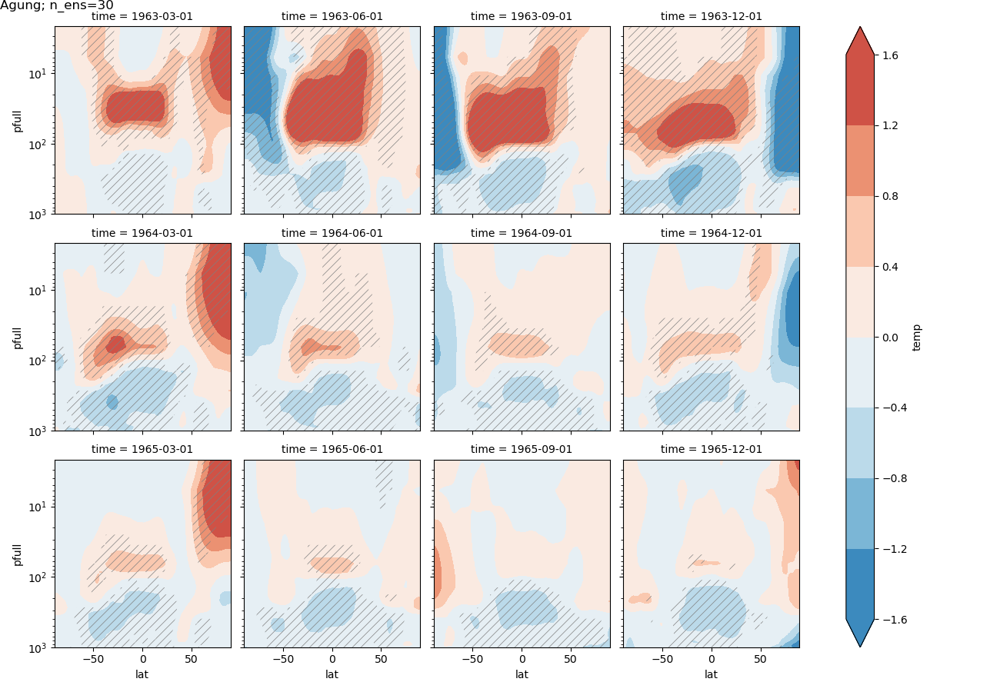

In [192]:
f = da.plot.contourf(col='time', col_wrap=4,
    robust=True, levels=np.arange(-1.6,1.61,0.4), center=0, extend='both', yincrease=False)
for ii, ax in enumerate(f.axes.flat):
#     mapplot(ax=ax, lw=0.2)
    pp = pvalue.isel(time=ii)
    pp.where(pp<0.05).pipe(lambda x:x*0).plot.contourf(ax=ax, 
        colors='None', hatches=['///'], facecolor='g', add_colorbar=False, add_labels=False, yincrease=False)
    ax.set_yscale('log')
plt.suptitle(f'{volcano_name}; n_ens={len(ens)}', x=0, y=1, ha='left')

## Ocean heat uptake ``sfc_hflux_coupler``

In [19]:
data_name = 'sfc_hflux_coupler'
nctag = 'ocean'
# da_ctl = get_ctl(data_name, ens=ens, year_volcano=year_volcano).rename(new_names).load()
# da_volcano = get_volcano(data_name, ens=ens).rename(new_names).load()
ncfile = f'cache/{nbname}.{data_name}.ctl.nc'
try:
    da_ctl = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_ctl = get_ctl(data_name, nctag=nctag, ens=ens, year_volcano=year_volcano).load()
    da_ctl.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

ncfile = f'cache/{nbname}.{data_name}.nc'
try:
    da_volcano = xr.open_dataarray(ncfile).load()
    print('Data loaded from', ncfile)
except:
    da_volcano = get_volcano(data_name, nctag=nctag, ens=ens).load()
    da_volcano.to_dataset().to_netcdf(ncfile)
    print('Data calculated and saved to', ncfile)

/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/times.py:132: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  enable_cftimeindex)
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/xarray/coding/variables.py:66: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy cftime.datetime objects instead, reason: dates out of range
  return self.func(self.array[key])
/tigress/wenchang/miniconda3/lib/python3.6/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.sfc_hflux_coupler.ctl.nc
Data calculated and saved to cache/volcano_impact_on_climate_agung.ipynb.sfc_hflux_coupler.nc


### Time series

In [20]:
# global mean time series
def area_mean(da, yt_ocean=None):
    '''area-weighted average for ocean data'''
    if yt_ocean is None:
        da_ = da
        area = ocean_tgrid_area
    else:
        da_ = da.sel(yt_ocean=yt_ocean)
        area = ocean_tgrid_area.sel(yt_ocean=yt_ocean)
    return (da * area).sum(['xt_ocean', 'yt_ocean'])/area.sum()
    
ts_ctl = area_mean(da_ctl)
ts_volcano = da_volcano.pipe(lambda x: x*ocean_tgrid_area).sum(['xt_ocean', 'yt_ocean'])/ocean_tgrid_area.sum()
tsa = ts_volcano - ts_ctl
# NH and SH mean time series
tsas = dict(NH=(da_volcano - da_ctl).pipe(lambda x: area_mean(x, yt_ocean=slice(0,90))),
           SH=(da_volcano - da_ctl).pipe(lambda x: area_mean(x, yt_ocean=slice(-90,0))))

# remove monthly climatology of CTL
ts_clim = ts_ctl.groupby('time.month').mean(['time', 'en'])
ts_volcano = ts_volcano.groupby('time.month') - ts_clim
ts_ctl = ts_ctl.groupby('time.month') - ts_clim

<IPython.core.display.Javascript object>


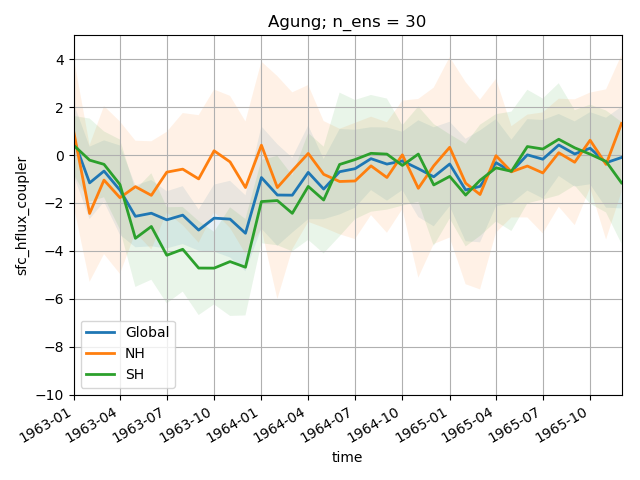

In [21]:
plt.fill_between(tsa.time.to_index().to_pydatetime(),
    tsa.mean('en') - tsa.std('en'),
    tsa.mean('en') + tsa.std('en'),
    alpha=0.1)
tsa.mean('en').plot(label='Global')

for key in ['NH', 'SH']:
    plt.fill_between(tsas[key].time.to_index().to_pydatetime(),
        tsas[key].mean('en') - tsas[key].std('en'),
    #     ts_ctl.max('en'),
        tsas[key].mean('en') + tsas[key].std('en'),
        alpha=0.1)
    tsas[key].mean('en').plot(label=key)

plt.ylabel(f'{data_name}')
plt.title(f'{volcano_name}; n_ens = {len(ens)}')
xticksmonth(range(1,13,3))
plt.grid(True)
plt.xlim(tsa.isel(time=[0,-1]).time.to_index())
plt.ylim(-10,5)
plt.legend(frameon=True, loc='lower left')
plt.tight_layout()